# Test Trace, Corner, And FPD

Minimal notebook for reading one multimass HMC `.nc` file, plotting diagnostics, and computing `fpd_31`, `fpd_32`, `fpd_34`.

In [1]:
import os
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
import sys

import arviz as az
import corner
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.constrained_layout.use'] = True

if str(Path.cwd()) not in sys.path:
    sys.path.append(str(Path.cwd()))


In [2]:
input_suffix = '_ss=2_full_light_multimass'
cosmo_tag = 'desi_planck'  # or 'pantheonsh0es'
# cosmo_tag = 'pantheonsh0es'  # or 'pantheonsh0es'
run_tag = '20260408_23'    # edit this
batch_idx = 3              # edit this

suffix_hmc = f"{input_suffix}_step6_{cosmo_tag}"
RUN_OUTPUT_DIR = Path('/mnt/lustre/tianli/quasar_hmc') / f'WFI2033{suffix_hmc}_{run_tag}'
NC_PATH = RUN_OUTPUT_DIR / f'WFI2033_{batch_idx}{suffix_hmc}.nc'

inf_data_pixel = az.from_netcdf(str(NC_PATH))
post = inf_data_pixel.posterior
num_chains = int(post.sizes['chain'])

print('NC_PATH =', NC_PATH)

NC_PATH = /mnt/lustre/tianli/quasar_hmc/WFI2033_ss=2_full_light_multimass_step6_desi_planck_20260408_23/WFI2033_3_ss=2_full_light_multimass_step6_desi_planck.nc


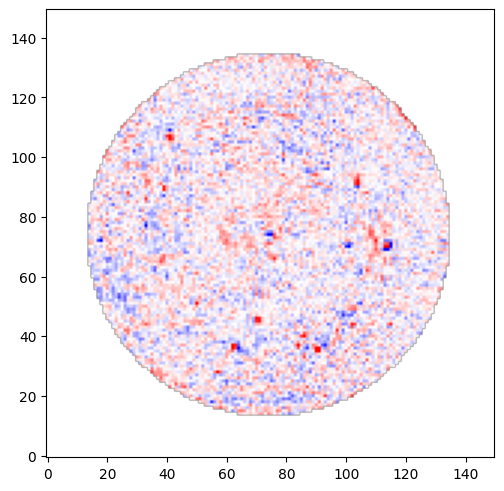

In [3]:
from astropy.io import fits
RESULT_DIR = Path(f'./result/result{'_ss=2_full_light_multimass'}_{'20260401_11'}')
DATA_SUB_PATH = RESULT_DIR / f'data_minus_lens_light{'_ss=2_full_light_multimass'}.fits'
data_subtracted = np.array(fits.getdata(DATA_SUB_PATH), dtype=float)
PRODUCTS_DIR = RESULT_DIR / 'data_products'
rms_file = np.array(fits.getdata(PRODUCTS_DIR / f'rms_with_psf_extra{'_ss=2_full_light_multimass'}.fits'), dtype=float)

MASK_OUT_PATH = './data/mask_out_center_r16.fits'
mask_out = np.array(fits.getdata(MASK_OUT_PATH), dtype=bool)
model_image = post.model_image.median(axis = 1)
plt.imshow(np.ma.array((data_subtracted - np.array(model_image[0,:,:]))/rms_file, mask=~mask_out), cmap = 'bwr', origin = 'lower', vmax = 3, vmin = -3)

In [4]:
source = post.pixels_source_grid.median(axis = 1)

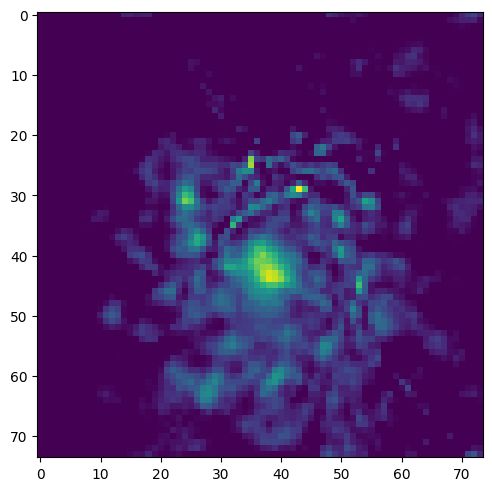

In [5]:
plt.imshow(source[5,:,:])

In [6]:
div = inf_data_pixel.sample_stats['diverging']
print('diverging dims =', div.dims)
print('diverging shape =', div.shape)

if div.dims == ('chain', 'draw', 'diverging_dim_0'):
    div_counts = np.asarray(div.sum(dim='draw').values, dtype=int)
    print('divergences per chain:')
    print(f'  block 0 (main lens/source/cosmo/AGN): {div_counts[:, 0]}')
    print(f'  block 1 (psf correction): {div_counts[:, 1]}')
else:
    print('divergences per chain:')
    print(np.asarray(div.sum(dim='draw').values, dtype=int))


diverging dims = ('chain', 'draw')
diverging shape = (6, 1000)
divergences per chain:
[3 0 0 0 0 0]


In [7]:
vars_mass = [
    'm2l_ratio', 'm2l_ratio_slope',
    'kappa_s_halo', 'gammain_halo', 'e_halo',
    'Rs_halo', 'center_halo', 'gamma_sheer_halo',
    'theta_E_g1', 'theta_E_g2',# 'theta_E_g3', 'theta_E_g7',
]
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
vars_point_source = ['ra_ps', 'dec_ps', 'log10_amp_ps']
vars_cosmo = ['omega_m_cosmo', 'H0_cosmo', 'kappa_ext']
vars_delay = ['fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']

available_trace_vars = [
    name for name in (vars_mass + vars_power + vars_point_source + vars_cosmo + vars_delay)
    if name in post.data_vars
]

corner_vars_main = [
    name for name in (vars_mass + vars_cosmo)
    if name in post.data_vars
]

corner_vars_delay = [
    name for name in (vars_cosmo + vars_delay)
    if name in post.data_vars
]

print('trace vars =', available_trace_vars)
print('main corner vars =', corner_vars_main)
print('delay corner vars =', corner_vars_delay)


trace vars = ['m2l_ratio', 'm2l_ratio_slope', 'kappa_s_halo', 'gammain_halo', 'e_halo', 'Rs_halo', 'center_halo', 'gamma_sheer_halo', 'theta_E_g1', 'theta_E_g2', 'n_source_grid', 'rho_source_grid', 'sigma_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps', 'omega_m_cosmo', 'H0_cosmo', 'kappa_ext', 'fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']
main corner vars = ['m2l_ratio', 'm2l_ratio_slope', 'kappa_s_halo', 'gammain_halo', 'e_halo', 'Rs_halo', 'center_halo', 'gamma_sheer_halo', 'theta_E_g1', 'theta_E_g2', 'omega_m_cosmo', 'H0_cosmo', 'kappa_ext']
delay corner vars = ['omega_m_cosmo', 'H0_cosmo', 'kappa_ext', 'fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']


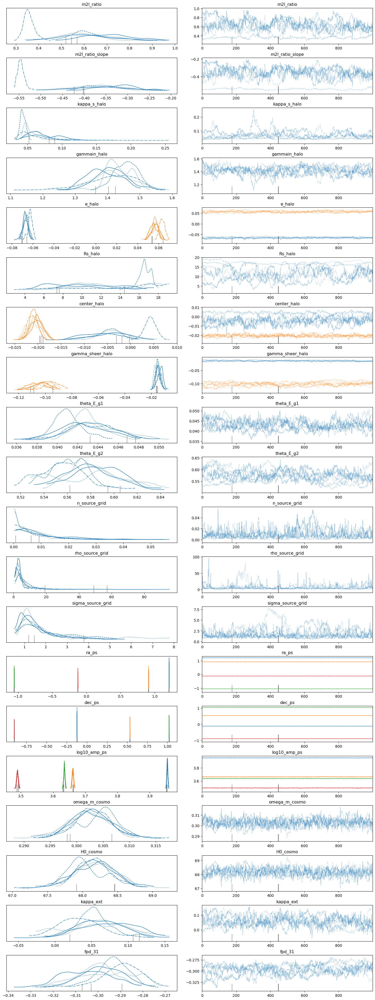

In [8]:
_ = az.plot_trace(
    inf_data_pixel,
    var_names=available_trace_vars,
    figsize=(14, max(8, 1.5 * len(available_trace_vars))),
    divergences=True,
)
plt.show()


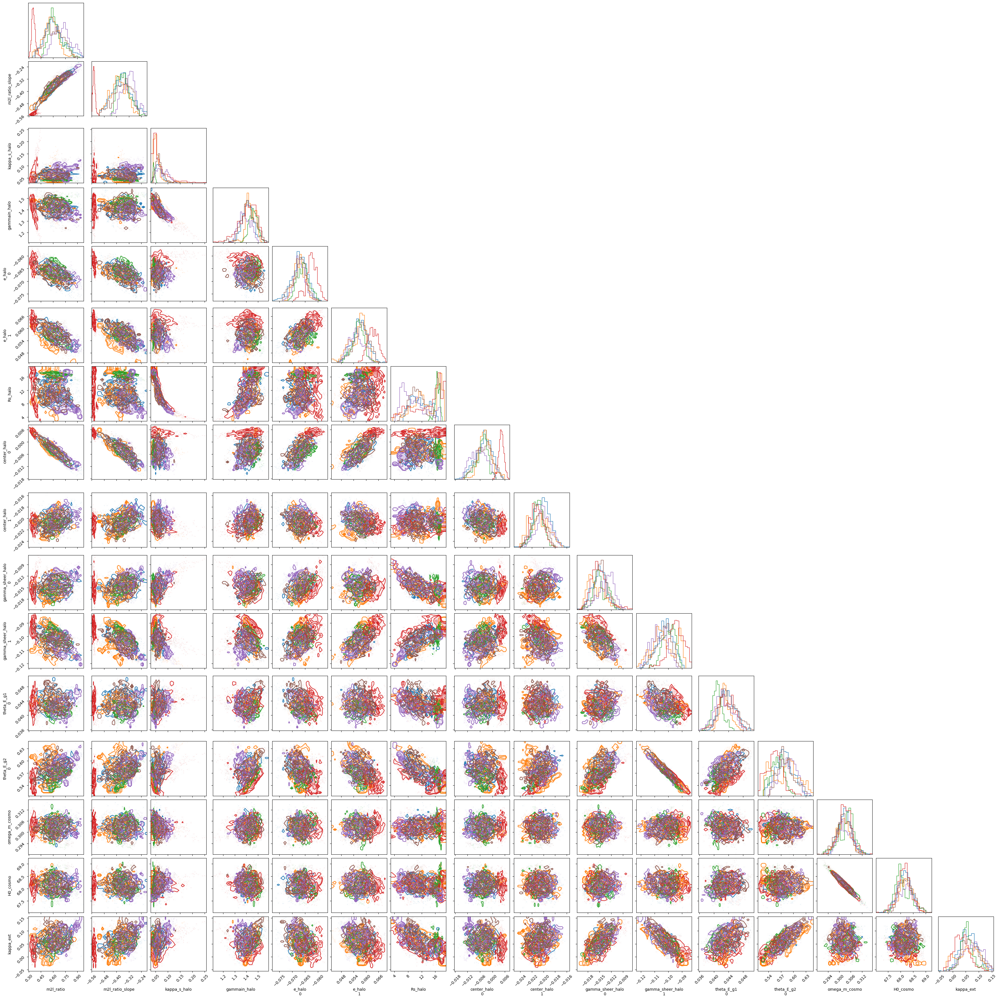

In [9]:
fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post.isel(chain=i),
        var_names=corner_vars_main,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


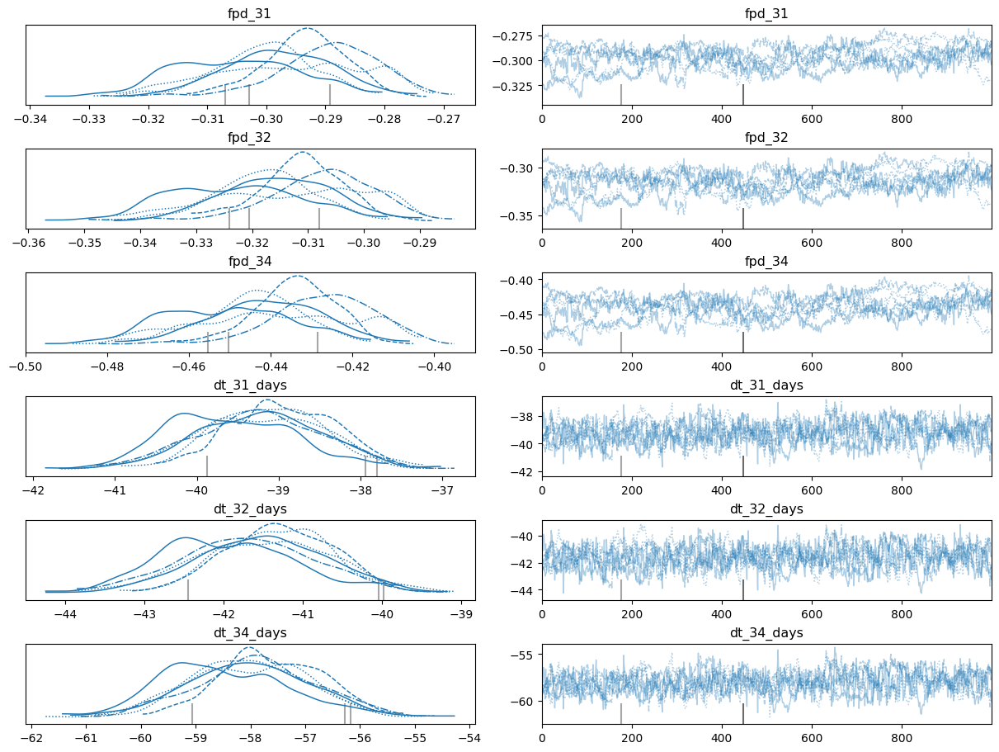

In [10]:
trace_delay_vars = [name for name in vars_delay if name in post.data_vars]
_ = az.plot_trace(
    inf_data_pixel,
    var_names=trace_delay_vars,
    figsize=(12, max(6, 1.5 * len(trace_delay_vars))),
)
plt.show()


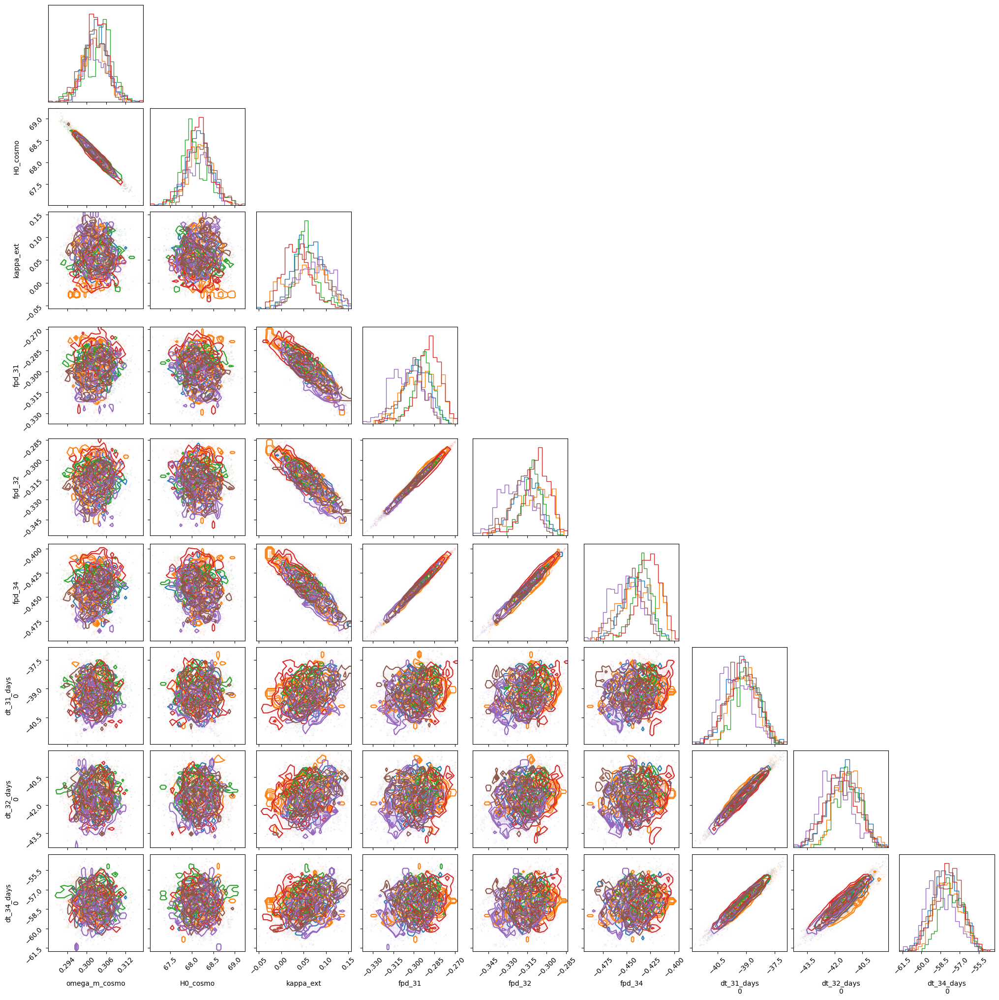

In [11]:
fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post.isel(chain=i),
        var_names=corner_vars_delay,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


In [12]:
for name in [n for n in vars_delay if n in post.data_vars]:
    vals = np.asarray(post[name].values, dtype=float)
    print(name, 'median by chain =', np.median(vals, axis=1))


fpd_31 median by chain = [-0.2981212  -0.29472867 -0.2931242  -0.28875979 -0.30535877 -0.30060278]
fpd_32 median by chain = [-0.31531577 -0.31049893 -0.31099578 -0.30691773 -0.32340279 -0.31828066]
fpd_34 median by chain = [-0.44105019 -0.43824846 -0.4336765  -0.42631677 -0.45077451 -0.44445819]
dt_31_days median by chain = [[-39.20497567]
 [-39.1002974 ]
 [-38.95911507]
 [-39.22505879]
 [-39.64532451]
 [-39.20964965]]
dt_32_days median by chain = [[-41.4943514 ]
 [-41.30750423]
 [-41.2948285 ]
 [-41.70910672]
 [-41.99045989]
 [-41.50983571]]
dt_34_days median by chain = [[-58.03290288]
 [-58.03900412]
 [-57.66685198]
 [-57.90037017]
 [-58.65623356]
 [-58.04429028]]


In [13]:
summary_vars = [
    name for name in (vars_mass + vars_power + vars_point_source + vars_cosmo + vars_delay)
    if name in post.data_vars
]
az.summary(post, var_names=summary_vars)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
m2l_ratio,0.583,0.144,0.328,0.819,0.045,0.022,11.0,34.0,1.53
m2l_ratio_slope,-0.389,0.087,-0.558,-0.277,0.030,0.018,11.0,29.0,1.53
kappa_s_halo,0.062,0.023,0.034,0.104,0.005,0.003,17.0,75.0,1.29
gammain_halo,1.419,0.060,1.310,1.526,0.010,0.004,38.0,232.0,1.12
e_halo[0],-0.066,0.003,-0.072,-0.060,0.001,0.000,17.0,31.0,1.27
e_halo[1],0.058,0.004,0.050,0.066,0.001,0.001,13.0,31.0,1.39
Rs_halo,12.468,3.926,5.548,18.029,1.082,0.272,15.0,29.0,1.33
center_halo[0],-0.003,0.005,-0.011,0.006,0.001,0.001,14.0,30.0,1.43
center_halo[1],-0.021,0.001,-0.023,-0.018,0.000,0.000,26.0,145.0,1.17
gamma_sheer_halo[0],-0.015,0.002,-0.019,-0.011,0.000,0.000,29.0,99.0,1.15


In [14]:
for i in range(num_chains):
    print(f'chain {i}')
    print(az.summary(post.isel(chain=[i]), var_names=[name for name in vars_cosmo + vars_delay if name in post.data_vars]))


chain 0


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.303  0.004   0.296    0.309      0.000    0.000     330.0   
H0_cosmo       68.153  0.275  67.641   68.656      0.016    0.010     318.0   
kappa_ext       0.061  0.032   0.003    0.120      0.005    0.002      45.0   
fpd_31         -0.298  0.009  -0.316   -0.281      0.002    0.001      33.0   
fpd_32         -0.315  0.010  -0.334   -0.297      0.002    0.001      36.0   
fpd_34         -0.441  0.014  -0.466   -0.414      0.002    0.001      32.0   
dt_31_days[0] -39.218  0.767 -40.539  -37.786      0.041    0.024     351.0   
dt_32_days[0] -41.511  0.825 -43.011  -39.952      0.045    0.025     335.0   
dt_34_days[0] -58.024  1.113 -60.138  -56.085      0.058    0.036     369.0   

               ess_tail  r_hat  
omega_m_cosmo     376.0    NaN  
H0_cosmo          385.0    NaN  
kappa_ext          77.0    NaN  
fpd_31             88.0    NaN  
fpd_32             90.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.302  0.003   0.296    0.308      0.001    0.000      28.0   
H0_cosmo       68.199  0.273  67.684   68.689      0.052    0.022      27.0   
kappa_ext       0.054  0.041  -0.021    0.116      0.021    0.004       4.0   
fpd_31         -0.295  0.012  -0.315   -0.274      0.008    0.002       2.0   
fpd_32         -0.312  0.013  -0.333   -0.290      0.007    0.001       3.0   
fpd_34         -0.438  0.019  -0.468   -0.406      0.013    0.002       2.0   
dt_31_days[0] -39.092  0.675 -40.141  -37.600      0.132    0.050      25.0   
dt_32_days[0] -41.297  0.717 -42.549  -39.864      0.124    0.058      33.0   
dt_34_days[0] -58.002  1.003 -59.670  -56.068      0.427    0.073       5.0   

               ess_tail  r_hat  
omega_m_cosmo      67.0    NaN  
H0_cosmo           93.0    NaN  
kappa_ext          36.0    NaN  
fpd_31             15.0    NaN  
fpd_32             15.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.304  0.004   0.295    0.311      0.002    0.001       4.0   
H0_cosmo       68.087  0.320  67.574   68.775      0.183    0.046       4.0   
kappa_ext       0.054  0.025   0.015    0.117      0.010    0.004       6.0   
fpd_31         -0.293  0.007  -0.308   -0.280      0.003    0.001       6.0   
fpd_32         -0.311  0.008  -0.328   -0.299      0.002    0.001      10.0   
fpd_34         -0.434  0.010  -0.454   -0.416      0.004    0.001       6.0   
dt_31_days[0] -38.937  0.637 -40.138  -37.802      0.123    0.049      27.0   
dt_32_days[0] -41.291  0.661 -42.514  -40.107      0.122    0.054      30.0   
dt_34_days[0] -57.604  0.906 -59.203  -55.852      0.163    0.065      31.0   

               ess_tail  r_hat  
omega_m_cosmo      50.0    NaN  
H0_cosmo           43.0    NaN  
kappa_ext          15.0    NaN  
fpd_31             14.0    NaN  
fpd_32             16.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.303  0.004   0.297    0.311      0.001    0.000      49.0   
H0_cosmo       68.132  0.278  67.544   68.644      0.042    0.018      46.0   
kappa_ext       0.035  0.030  -0.023    0.091      0.005    0.003      31.0   
fpd_31         -0.290  0.010  -0.309   -0.272      0.004    0.002       4.0   
fpd_32         -0.308  0.011  -0.329   -0.289      0.004    0.002       5.0   
fpd_34         -0.428  0.014  -0.452   -0.401      0.005    0.002       6.0   
dt_31_days[0] -39.224  0.781 -40.702  -37.813      0.401    0.051       4.0   
dt_32_days[0] -41.695  0.841 -43.373  -40.264      0.405    0.057       4.0   
dt_34_days[0] -57.876  1.083 -59.955  -55.925      0.461    0.070       6.0   

               ess_tail  r_hat  
omega_m_cosmo     123.0    NaN  
H0_cosmo          125.0    NaN  
kappa_ext          56.0    NaN  
fpd_31             33.0    NaN  
fpd_32             33.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.303  0.003   0.297    0.309      0.001    0.000      30.0   
H0_cosmo       68.163  0.271  67.659   68.626      0.052    0.021      29.0   
kappa_ext       0.074  0.035   0.006    0.129      0.009    0.003      14.0   
fpd_31         -0.305  0.011  -0.325   -0.285      0.004    0.002       9.0   
fpd_32         -0.324  0.012  -0.344   -0.302      0.004    0.001       9.0   
fpd_34         -0.451  0.016  -0.477   -0.420      0.005    0.002       9.0   
dt_31_days[0] -39.610  0.764 -40.826  -38.031      0.129    0.086      36.0   
dt_32_days[0] -41.958  0.857 -43.466  -40.258      0.151    0.109      33.0   
dt_34_days[0] -58.521  1.126 -60.337  -56.205      0.191    0.147      36.0   

               ess_tail  r_hat  
omega_m_cosmo     106.0    NaN  
H0_cosmo           85.0    NaN  
kappa_ext          39.0    NaN  
fpd_31             18.0    NaN  
fpd_32             18.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.302  0.004   0.295    0.309      0.001    0.000      41.0   
H0_cosmo       68.237  0.282  67.768   68.765      0.048    0.024      38.0   
kappa_ext       0.070  0.033   0.019    0.144      0.007    0.003      26.0   
fpd_31         -0.301  0.009  -0.321   -0.287      0.002    0.001      30.0   
fpd_32         -0.319  0.010  -0.340   -0.303      0.002    0.001      31.0   
fpd_34         -0.446  0.014  -0.476   -0.425      0.003    0.001      28.0   
dt_31_days[0] -39.234  0.761 -40.520  -37.822      0.099    0.038      60.0   
dt_32_days[0] -41.536  0.833 -43.032  -40.072      0.115    0.044      53.0   
dt_34_days[0] -58.055  1.075 -60.029  -56.179      0.128    0.050      71.0   

               ess_tail  r_hat  
omega_m_cosmo      92.0    NaN  
H0_cosmo           91.0    NaN  
kappa_ext          73.0    NaN  
fpd_31             84.0    NaN  
fpd_32             79.0    NaN  
fpd_34     